# Melanoma Detection Using a CNN
Cancer is a common illness caused by cells in the body growing out of control. It can show up in different ways, such as Breast Cancer, Lung Cancer, and Pancreatic Cancer.

Skin Cancer, particularly Melanoma, is often treatable, but its prognosis can turn severe without early detection. Therefore, it is crucial to distinguish between malignant and benign tumors.

The proposed model employs Convolutional Neural Networks for image classification, demonstrating the potential to achieve favorable outcomes in identifying cancer types.

****1 Data Preparation****

Data preparation in melanoma detection involves organizing and pre-processing the data used to train and test the model for identifying melanoma. This process is crucial to ensure the model's effectiveness. Here are the key steps involved in data preparation for melanoma detection.
1. Import all important python libraries
2. Reading the dataset
     * Analyzing the data(shape,head,tail,info etc)
     * Check for Duplicates
     * Missing value calculation
3. Data Reduction
4. Feature Engineering
5. Creating Features
6. Data Cleaning/Wrangling
7. EDA (trends,patterns, outliers,insigihts,missing values)
8. Statistics summary(describe)
9. EDA Univariant Analysis
10. Data Trasnformation
11. EDA Bivariant Analysis
12. EDA Multivariant Analysis (Heat Map)
13. Impute missing values (Mean,Mode & Median)

Import all important python libraries

In [1]:
import pandas as pd                                       # to read csv file 
import numpy as np                                        #numerical computing library
import seaborn as sns                                     #data visualization library
import matplotlib.pyplot as plt                           #data visualization library
import os                                                 #related to file and directory manipulation
from PIL import Image
#from sklearn.model_selection import train_test_split

By using the OS module acess the images

In [2]:
file_path= '/kaggle/input/siim-isic-melanoma-classification/jpeg/train'
name_class = os.listdir(file_path)
name_class[1:11]

['ISIC_4442506.jpg',
 'ISIC_0375775.jpg',
 'ISIC_9054603.jpg',
 'ISIC_1691175.jpg',
 'ISIC_7966716.jpg',
 'ISIC_2201390.jpg',
 'ISIC_2421696.jpg',
 'ISIC_3943822.jpg',
 'ISIC_7021739.jpg',
 'ISIC_1739742.jpg']

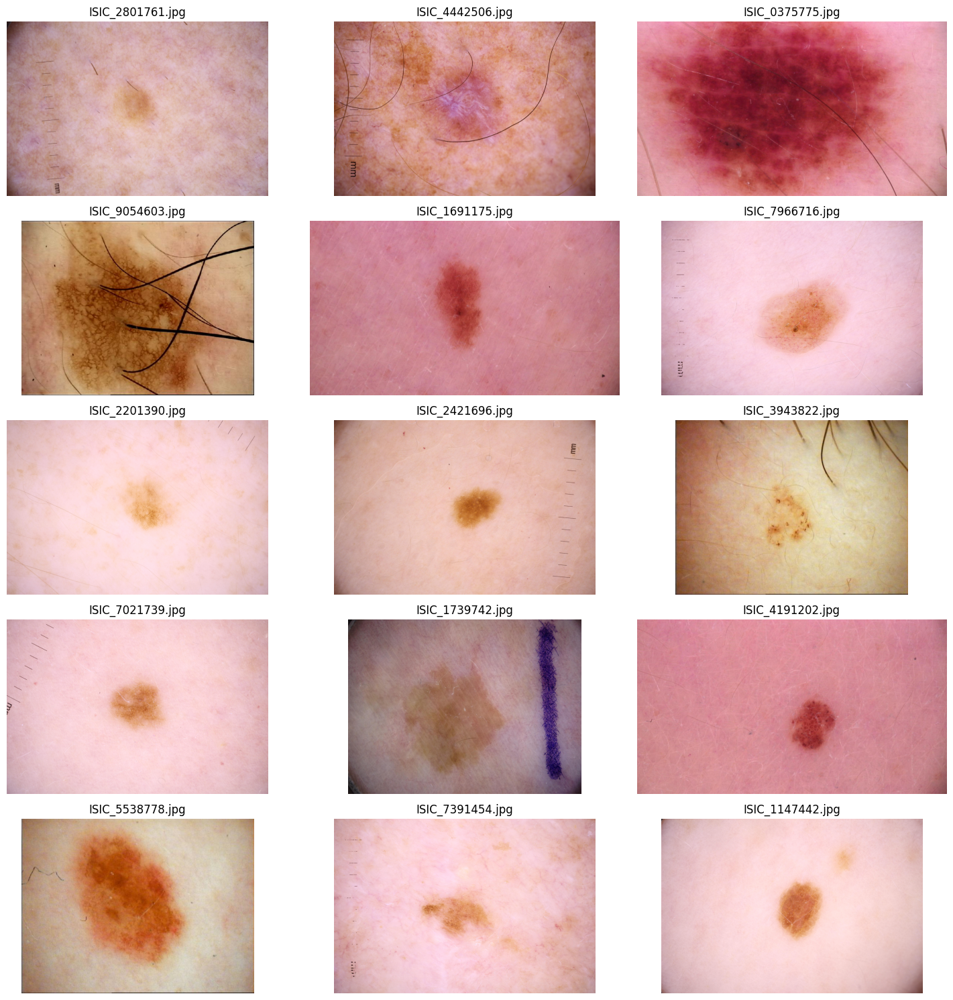

In [3]:
# Define the number of rows and columns for subplots
num_rows = 5
num_cols = 3

# Create a subplot grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

# Iterate over the file names and display images
for i, file_name in enumerate(name_class[:num_rows*num_cols]):
    # Load image using PIL
    img_path = os.path.join(file_path, file_name)
    img = Image.open(img_path)
    
    # Plot the image
    axes[i // num_cols, i % num_cols].imshow(img)
    axes[i // num_cols, i % num_cols].set_title(file_name)
    axes[i // num_cols, i % num_cols].axis('off')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()


In [4]:
file_path_test= '/kaggle/input/siim-isic-melanoma-classification/jpeg/test'
name_class = os.listdir(file_path_test)
name_class[1:11]

['ISIC_0546632.jpg',
 'ISIC_2227618.jpg',
 'ISIC_7969975.jpg',
 'ISIC_3356592.jpg',
 'ISIC_8170270.jpg',
 'ISIC_2799021.jpg',
 'ISIC_4693305.jpg',
 'ISIC_3783148.jpg',
 'ISIC_9729657.jpg',
 'ISIC_1792101.jpg']

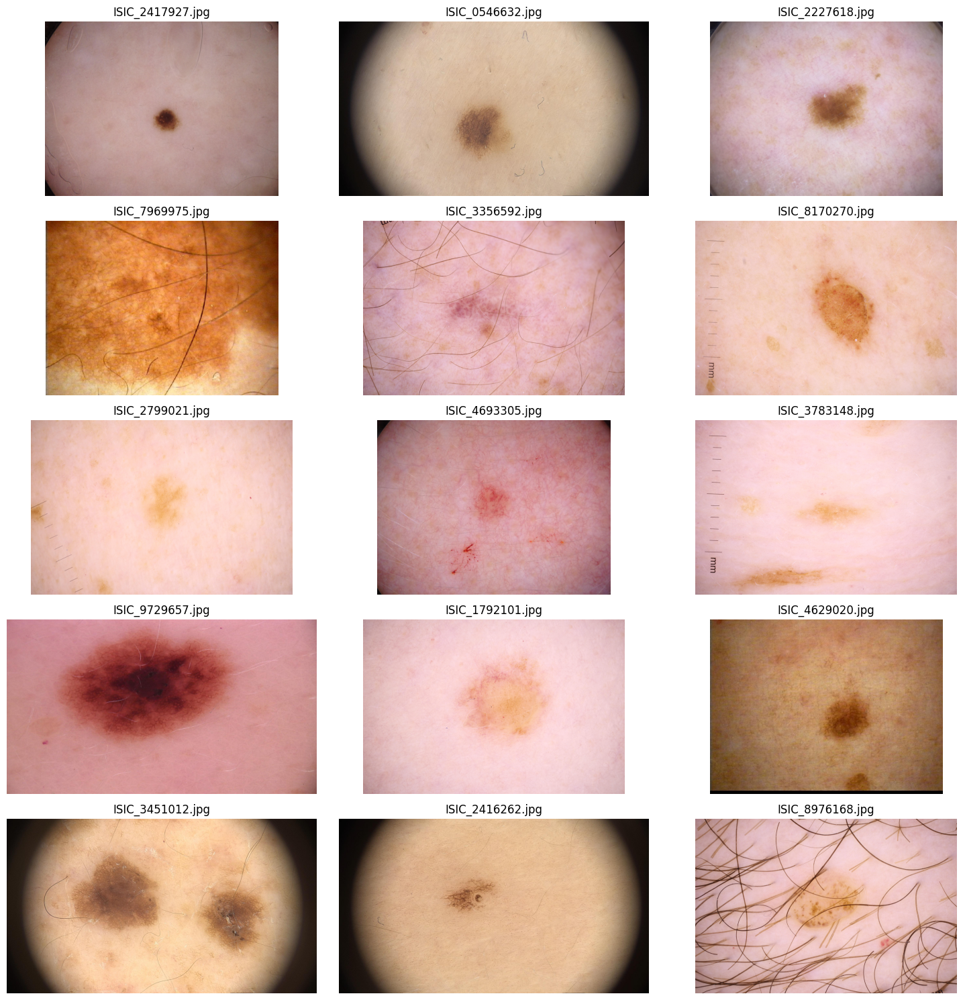

In [5]:
# Define the number of rows and columns for subplots
num_rows = 5
num_cols = 3

# Create a subplot grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

# Iterate over the file names and display images
for i, file_name in enumerate(name_class[:num_rows*num_cols]):
    # Load image using PIL
    img_path = os.path.join(file_path_test, file_name)
    img = Image.open(img_path)
    
    # Plot the image
    axes[i // num_cols, i % num_cols].imshow(img)
    axes[i // num_cols, i % num_cols].set_title(file_name)
    axes[i // num_cols, i % num_cols].axis('off')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

In [6]:
from pathlib import Path

# Specify the paths to the directories containing the train and test images
train_dir_path = "/kaggle/input/siim-isic-melanoma-classification/jpeg/train"
test_dir_path = "/kaggle/input/siim-isic-melanoma-classification/jpeg/test"

# Convert the string paths to Path objects
train_path = Path(train_dir_path)
test_path = Path(test_dir_path)

# Count the number of images in the train and test directories using glob
image_count_train = len(list(train_path.glob('*.jpg')))
print("Number of images in train directory:", image_count_train)

image_count_test = len(list(test_path.glob('*.jpg')))
print("Number of images in test directory:", image_count_test)


Number of images in train directory: 33126
Number of images in test directory: 10982


**Preprocessing of train.csv**

**Reading the dataset**

By using the command pd.read_csv fetch the test.csv dataset and process it
Return the first five items of dataset after processing using the .head()

In [7]:
train_data = pd.read_csv('/kaggle/input/siim-isic-melanoma-classification/train.csv')
train_data.head()

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,diagnosis,benign_malignant,target
0,ISIC_2637011,IP_7279968,male,45.0,head/neck,unknown,benign,0
1,ISIC_0015719,IP_3075186,female,45.0,upper extremity,unknown,benign,0
2,ISIC_0052212,IP_2842074,female,50.0,lower extremity,nevus,benign,0
3,ISIC_0068279,IP_6890425,female,45.0,head/neck,unknown,benign,0
4,ISIC_0074268,IP_8723313,female,55.0,upper extremity,unknown,benign,0


**Analyzing the data**

checking the shape, tail, describe and info of the dataset

In [8]:
train_data.tail()

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,diagnosis,benign_malignant,target
33121,ISIC_9999134,IP_6526534,male,50.0,torso,unknown,benign,0
33122,ISIC_9999320,IP_3650745,male,65.0,torso,unknown,benign,0
33123,ISIC_9999515,IP_2026598,male,20.0,lower extremity,unknown,benign,0
33124,ISIC_9999666,IP_7702038,male,50.0,lower extremity,unknown,benign,0
33125,ISIC_9999806,IP_0046310,male,45.0,torso,nevus,benign,0


In [9]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33126 entries, 0 to 33125
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   image_name                     33126 non-null  object 
 1   patient_id                     33126 non-null  object 
 2   sex                            33061 non-null  object 
 3   age_approx                     33058 non-null  float64
 4   anatom_site_general_challenge  32599 non-null  object 
 5   diagnosis                      33126 non-null  object 
 6   benign_malignant               33126 non-null  object 
 7   target                         33126 non-null  int64  
dtypes: float64(1), int64(1), object(6)
memory usage: 2.0+ MB


In [10]:
train_data.describe()

,age_approx,target
count,33058.000000,33126.000000
mean,48.870016,0.017630
std,14.380360,0.131603
min,0.000000,0.000000
25%,40.000000,0.000000
50%,50.000000,0.000000
75%,60.000000,0.000000
max,90.000000,1.000000


In [11]:
train_data.size

265008

In [12]:
train_data.shape

(33126, 8)

**Check for Duplicates**

In [13]:
# Check for duplicates in the 'image_name' column
image_name_duplicates = train_data['image_name'].duplicated()
print(image_name_duplicates)
# Print the rows containing duplicate 'image_name'
print("Duplicate Rows based on 'image_name':")
print(train_data[image_name_duplicates])


0        False
1        False
2        False
3        False
4        False
         ...  
33121    False
33122    False
33123    False
33124    False
33125    False
Name: image_name, Length: 33126, dtype: bool
Duplicate Rows based on 'image_name':
Empty DataFrame
Columns: [image_name, patient_id, sex, age_approx, anatom_site_general_challenge, diagnosis, benign_malignant, target]
Index: []


**Missing value calculation**  or **Data Cleaning**

In [14]:
# Check for missing values in the entire DataFrame
missing_values = train_data.isnull().sum()
# Print the columns with missing values
print("Columns with Missing Values:")
print(missing_values[missing_values > 0])

Columns with Missing Values:
sex                               65
age_approx                        68
anatom_site_general_challenge    527
dtype: int64


**Unique values for the columns with the missing values**

In [15]:
print(train_data['sex'].unique())

['male' 'female' nan]


In [16]:
print(train_data['age_approx'].unique())

[45. 50. 55. 40. 25. 35. 30. 75. 70. 65. 60. nan 80. 20. 85. 15. 90. 10.
  0.]


In [17]:
print(train_data['anatom_site_general_challenge'].unique())

['head/neck' 'upper extremity' 'lower extremity' 'torso' nan 'palms/soles'
 'oral/genital']


****Checking for the outliers before handling the missing values****

before start to handling the missing values it is always advisable to check the Outliers. Because the outliers can affect the accuracy of the imputation of the missing values.

**some common techniques to detect outliers in your dataset:**

**Visual Inspection:**

**Boxplots**: Boxplots are graphical representations that display the distribution of data along a number line, highlighting the median, quartiles, and potential outliers.

**Scatter plots**: Scatter plots can help identify outliers by visualizing the relationship between two variables. Outliers may appear as points that are far away from the main cluster of data points.

**Statistical Methods**:

**Z-Score**: Calculate the Z-score for each data point, which measures how many standard deviations an observation is away from the mean. Points with Z-scores beyond a certain threshold (commonly 2.5 or 3) can be considered outliers.

**IQR (Interquartile Range)**: Calculate the interquartile range (IQR) for each numerical variable, which is the difference between the 75th and 25th percentiles. Points outside a defined range (e.g., 1.5 times the IQR above the third quartile or below the first quartile) can be flagged as outliers.

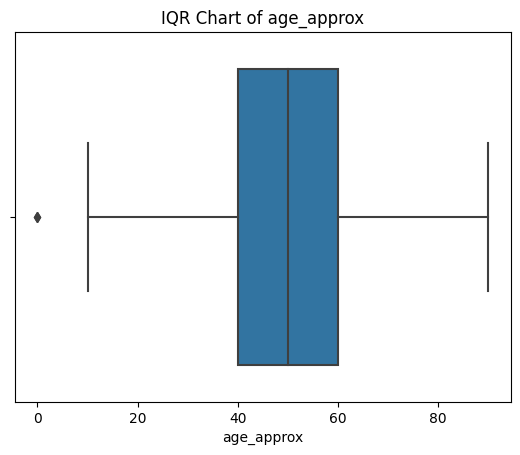

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


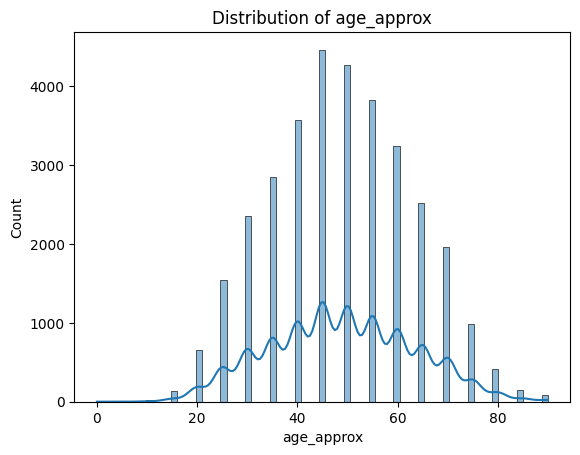

Outliers:
9647     0.0
22645    0.0
Name: age_approx, dtype: float64



In [18]:
# Select a specific variable/column for analysis
variable = 'age_approx'  

# Extract the data for the selected variable
data = train_data[variable]

# Calculate quartiles and IQR
Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)
IQR = Q3 - Q1

# Find outliers using IQR
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers = data[(data < lower_bound) | (data > upper_bound)]



# Plot IQR chart
sns.boxplot(x=data)
plt.title("IQR Chart of " + variable)
plt.xlabel(variable)
plt.show()

# Plot histogram
sns.histplot(data, kde=True)
plt.title("Distribution of " + variable)
plt.xlabel(variable)
plt.ylabel("Count")
plt.show()

# Print results
print("Outliers:")
print(outliers)
print()



there is no outliers for the AGE and we are good to go for the imputation of missing values.

**impute missing values with the mode (most frequent value) for the categorical variables**

Identifying outliers for categorical variables such as "anatom_site_general_challenge" is not a conventional task because outliers are typically associated with numerical data points. However, we can still perform most frequent value to identify unusual or potentially erroneous values in categorical columns. 

In [19]:
# Calculate the frequency counts of each category in the column
frequency_counts = train_data['anatom_site_general_challenge'].value_counts()
print(frequency_counts)
# Find the most frequent category (mode)
most_frequent_category = frequency_counts.index[0]
print("the mode is", most_frequent_category)

anatom_site_general_challenge
torso              16845
lower extremity     8417
upper extremity     4983
head/neck           1855
palms/soles          375
oral/genital         124
Name: count, dtype: int64
the mode is torso


In [20]:
frequency_counts_gender = train_data['sex'].value_counts()
print(frequency_counts_gender)
# Find the most frequent category (mode)
most_frequent_category_sex = frequency_counts_gender.index[0]
print("the mode is", most_frequent_category_sex)

sex
male      17080
female    15981
Name: count, dtype: int64
the mode is male


**Handling or replacing the missing values of each column**

replace the non-numerical column of "sex" and "anatom_site_general_challenge" with **most frequent value or mode** and the numeric column "age_approx" with the **median**

In [21]:
# Replace missing values with the most frequent category
train_data['anatom_site_general_challenge'].fillna(most_frequent_category, inplace=True)
train_data['sex'].fillna(most_frequent_category_sex, inplace=True)

# Replace missing values with the median
median_age = 50
train_data['age_approx'].fillna(median_age, inplace=True)



/tmp/ipykernel_18/1801717265.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  train_data['anatom_site_general_challenge'].fillna(most_frequent_category, inplace=True)
/tmp/ipykernel_18/1801717265.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col

check the successful handling of missing values

In [22]:
missing_values_after = train_data['anatom_site_general_challenge'].isnull().sum()
print("Number of missing values after replacement for the anatomy site:", missing_values_after)

missing_values_after1 = train_data['sex'].isnull().sum()
print("Number of missing values after replacement for the sex:", missing_values_after1)

missing_values_after2 = train_data['age_approx'].isnull().sum()
print("Number of missing values after replacement for the age_approx:", missing_values_after2)




Number of missing values after replacement for the anatomy site: 0
Number of missing values after replacement for the sex: 0
Number of missing values after replacement for the age_approx: 0


In [23]:
# Check for missing values in the entire DataFrame after handling of missing values
missing_values_after = train_data.isnull().sum()
# Print the columns with missing values
print("Columns with Missing Values:")
print(missing_values_after[missing_values_after > 0])

Columns with Missing Values:
Series([], dtype: int64)


**EDA (Exploratory Data Analysis)**

**Univariate Analysis**

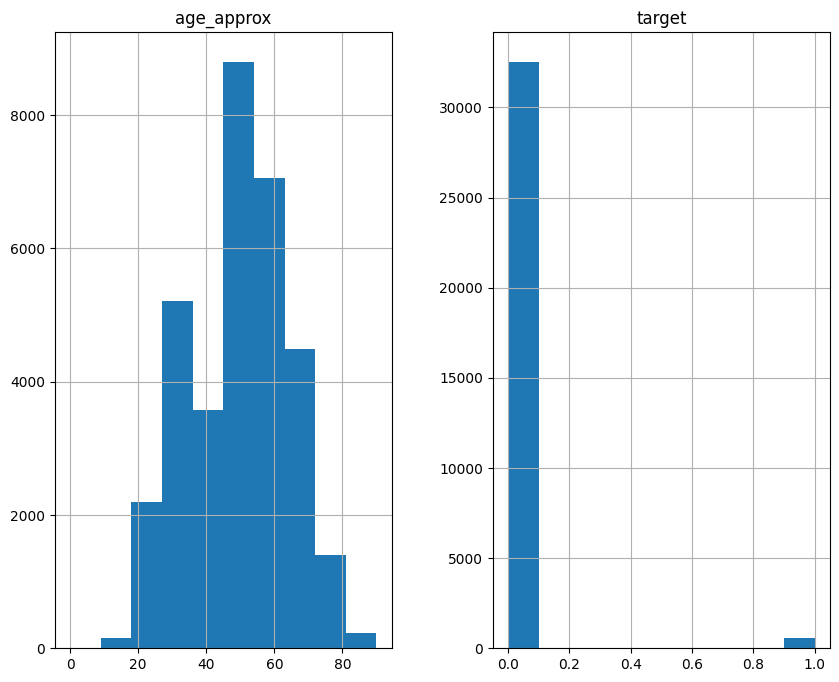

In [24]:
# For example, plot histograms of numerical columns
train_data.hist(figsize=(10, 8))
plt.show()


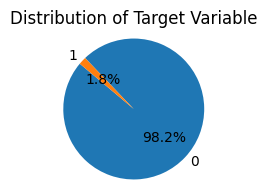

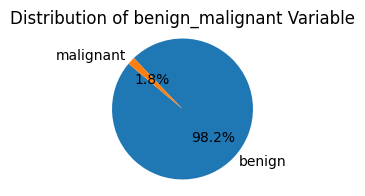

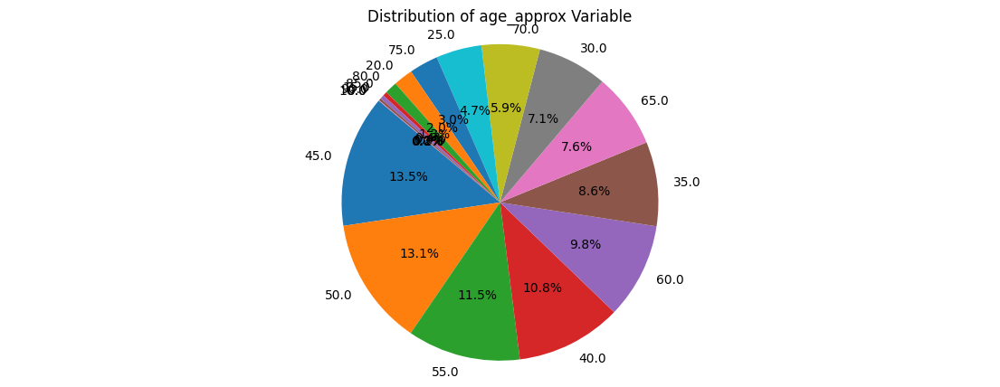

In [25]:
# Calculate the distribution of the target variable
target_counts = train_data['target'].value_counts()

# Plotting the pie chart
plt.figure(figsize=(2, 2))
plt.pie(target_counts, labels=target_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Target Variable')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()
#or 
# Calculate the distribution of the benign_malignant variable
target_counts1 = train_data['benign_malignant'].value_counts()

# Plotting the pie chart
plt.figure(figsize=(2, 2))
plt.pie(target_counts1, labels=target_counts1.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of benign_malignant Variable')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()

# Calculate the distribution of the age_approx variable
target_counts2 = train_data['age_approx'].value_counts()

# Plotting the pie chart
plt.figure(figsize=(14, 5))
plt.pie(target_counts2, labels=target_counts2.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of age_approx Variable')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()



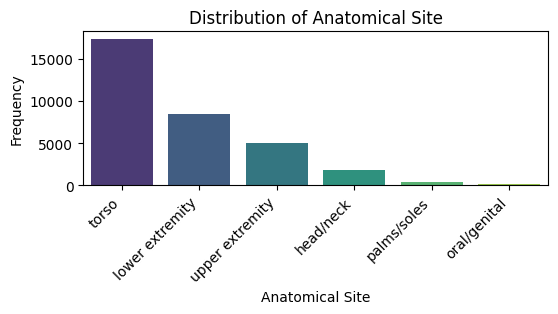

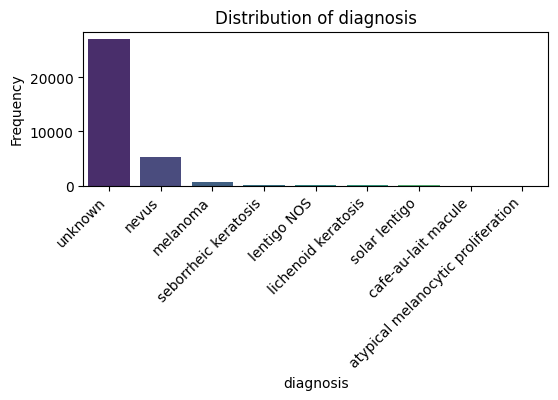

In [26]:
# Count the frequency of each category in the 'anatom_site_general_challenge' column
anatom_site_counts = train_data['anatom_site_general_challenge'].value_counts()

# Plotting the bar plot
plt.figure(figsize=(6, 2))
sns.barplot(x=anatom_site_counts.index, y=anatom_site_counts.values, palette="viridis")
plt.xticks(rotation=45, ha='right')
plt.xlabel('Anatomical Site')
plt.ylabel('Frequency')
plt.title('Distribution of Anatomical Site')
plt.show()

# Count the frequency of each category in the 'diagnosis' column
anatom_site_counts1 = train_data['diagnosis'].value_counts()

# Plotting the bar plot
plt.figure(figsize=(6, 2))
sns.barplot(x=anatom_site_counts1.index, y=anatom_site_counts1.values, palette="viridis")
plt.xticks(rotation=45, ha='right')
plt.xlabel('diagnosis')
plt.ylabel('Frequency')
plt.title('Distribution of diagnosis')
plt.show()


**Bivariate Analysis**

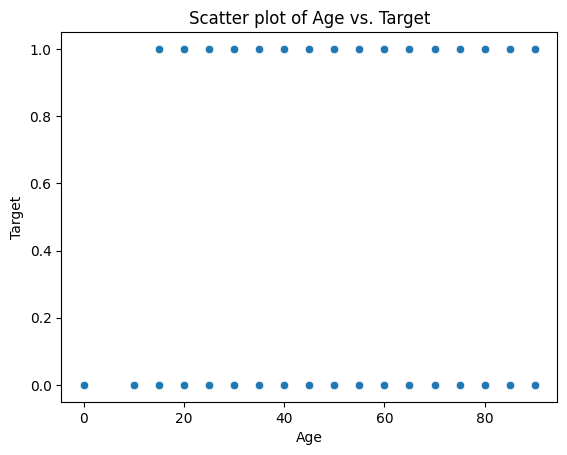

In [27]:
sns.scatterplot(x='age_approx', y='target', data=train_data)
plt.xlabel('Age')
plt.ylabel('Target')
plt.title('Scatter plot of Age vs. Target')
plt.show()


**Multivariate Analysis**

In [28]:
# Selecting the columns for the pair plot
columns_for_pairplot = ['age_approx', 'anatom_site_general_challenge', 'sex']

# Creating the pair plot
#sns.pairplot(train_data.sample(1000), hue='age_approx', vars=columns_for_pairplot)
#plt.title('Pair Plot of Sex, Anatomical Site, and Age')
#plt.show()


**Check whether the target column is balanced or not**

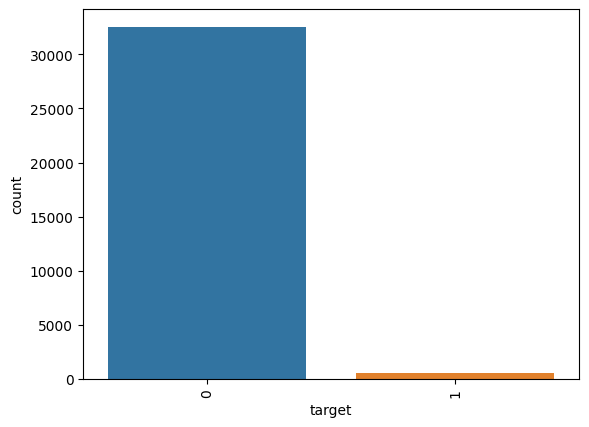

In [29]:
import seaborn as sns
counts= train_data.target.value_counts()
sns.barplot(x=counts.index, y= counts)
plt.xlabel('target')
plt.xticks(rotation=90);


When using a Convolutional Neural Network (CNN) for detection tasks, such as melanoma detection, addressing class imbalance is crucial for the model to effectively learn and generalize across both classes. Here's how we can approach class imbalance with CNNs:

**Resampling Techniques:**

**Oversampling the minority class:**
This involves generating synthetic samples for the minority class to increase its representation in the dataset. Techniques like Synthetic Minority Over-sampling Technique (SMOTE) or its variants can be used to create synthetic samples.

**Undersampling the majority class:**
This involves randomly removing samples from the majority class to balance the dataset. However, undersampling may lead to loss of information and might not be suitable for complex datasets.

For CNNs, oversampling the minority class is often preferred over undersampling because it helps in retaining more information and does not reduce the size of the dataset, which is important for CNNs to learn complex patterns

In [30]:
pip install imbalanced-learn

Note: you may need to restart the kernel to use updated packages.


In [31]:
from imblearn.over_sampling import SMOTE  # Synthetic Minority Over-sampling Technique

# Extract target variable
y = train_data['target']

# Apply SMOTE to oversample the minority class in the target variable
smote = SMOTE(random_state=42)
_, y_smote = smote.fit_resample(train_data[['target']], y)

# y_smote now contains the oversampled target variable (y) with balanced classes


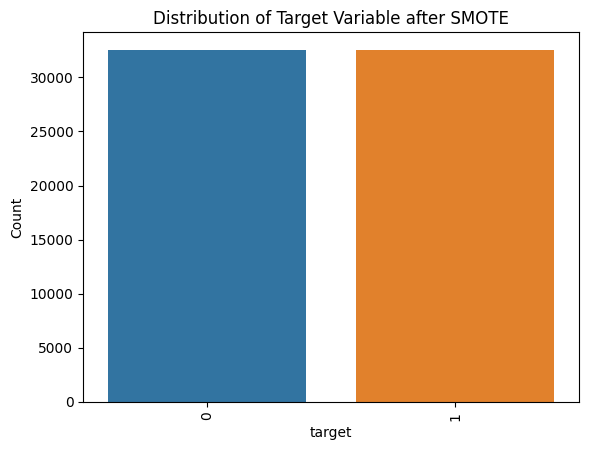

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming y_smote is the target variable after applying SMOTE
counts_after = y_smote.value_counts()

# Plot the distribution of the target variable after applying SMOTE
sns.barplot(x=counts_after.index, y=counts_after)
plt.xlabel('target')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.title('Distribution of Target Variable after SMOTE')
plt.show()

*********************************************************************************************************************************************************

*********************************************************************************************************************************************************

**Preprocessing of test.csv**

In [33]:
test_data = pd.read_csv('/kaggle/input/siim-isic-melanoma-classification/test.csv')
test_data.head()

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge
0,ISIC_0052060,IP_3579794,male,70.0,NaN
1,ISIC_0052349,IP_7782715,male,40.0,lower extremity
2,ISIC_0058510,IP_7960270,female,55.0,torso
3,ISIC_0073313,IP_6375035,female,50.0,torso
4,ISIC_0073502,IP_0589375,female,45.0,lower extremity


**Analyzing the data**

checking the shape, tail, describe and info of the dataset

In [34]:
test_data.tail()

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge
10977,ISIC_9992485,IP_4152479,male,40.0,torso
10978,ISIC_9996992,IP_4890115,male,35.0,torso
10979,ISIC_9997917,IP_2852390,male,25.0,upper extremity
10980,ISIC_9998234,IP_8861963,male,65.0,lower extremity
10981,ISIC_9999302,IP_6214039,male,30.0,upper extremity


In [35]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10982 entries, 0 to 10981
Data columns (total 5 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   image_name                     10982 non-null  object 
 1   patient_id                     10982 non-null  object 
 2   sex                            10982 non-null  object 
 3   age_approx                     10982 non-null  float64
 4   anatom_site_general_challenge  10631 non-null  object 
dtypes: float64(1), object(4)
memory usage: 429.1+ KB


In [36]:
test_data.describe()

,age_approx
count,10982.000000
mean,49.525587
std,14.370589
min,10.000000
25%,40.000000
50%,50.000000
75%,60.000000
max,90.000000


In [37]:
test_data.size

54910

In [38]:
test_data.shape

(10982, 5)

**Check for duplicates**

In [39]:
# Check for duplicates in the 'image_name' column
image_name_duplicates = test_data['image_name'].duplicated()
print(image_name_duplicates)
# Print the rows containing duplicate 'image_name'
print("Duplicate Rows based on 'image_name':")
print(test_data[image_name_duplicates])

0        False
1        False
2        False
3        False
4        False
         ...  
10977    False
10978    False
10979    False
10980    False
10981    False
Name: image_name, Length: 10982, dtype: bool
Duplicate Rows based on 'image_name':
Empty DataFrame
Columns: [image_name, patient_id, sex, age_approx, anatom_site_general_challenge]
Index: []


****Missing value calculation or Data Cleaning****

In [40]:
# Check for missing values in the entire DataFrame
missing_values1 = test_data.isnull().sum()
# Print the columns with missing values
print("Columns with Missing Values:")
print(missing_values1[missing_values1 > 0])

Columns with Missing Values:
anatom_site_general_challenge    351
dtype: int64


**impute missing values with the mode (most frequent value) for the categorical variables**
Calculate the frequency counts of the colum

In [41]:
frequency_counts1 = test_data['anatom_site_general_challenge'].value_counts() 
print(frequency_counts1)
most_frequent_category2 = frequency_counts1.index[0] 
print("the mode is", most_frequent_category2)

anatom_site_general_challenge
torso              5847
lower extremity    2501
upper extremity    1573
head/neck           576
palms/soles         108
oral/genital         26
Name: count, dtype: int64
the mode is torso


**Replace missing values with the most frequent category**

In [42]:
test_data['anatom_site_general_challenge'].fillna(most_frequent_category, inplace=True)

# Check for missing values in the entire DataFrame
missing_values_test_after = test_data.isnull().sum()
# Print the columns with missing values
print("Columns with Missing Values:")
print(missing_values_test_after[missing_values_test_after > 0])

Columns with Missing Values:
Series([], dtype: int64)


/tmp/ipykernel_18/1680446121.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  test_data['anatom_site_general_challenge'].fillna(most_frequent_category, inplace=True)


**check specifically**

In [43]:
missing_values_after_test = test_data['anatom_site_general_challenge'].isnull().sum()
print("Number of missing values after replacement for the anatomy site:", missing_values_after_test)

Number of missing values after replacement for the anatomy site: 0


*********************************************************************************************************************************************************
*********************************************************************************************************************************************************

**Apply One Code Encoding for both Train asnd Test data**

**One Hot Encoding**

Transforming all categorical features to numerical.

step 1: sex, anatomy, diagnosis need to be encoded.

step 2: benign_malignant column will be dropped, as the information is already in the target column.

In [44]:
# SKLearn
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

# === TRAIN ===
to_encode = ['sex', 'anatom_site_general_challenge', 'diagnosis']
encoded_all = []

label_encoder = LabelEncoder()

for column in to_encode:
    encoded = label_encoder.fit_transform(train_data[column])
    encoded_all.append(encoded)
    
train_data['sex'] = encoded_all[0]  # 1 for male and 0 for female
train_data['anatom_site_general_challenge'] = encoded_all[1]
train_data['diagnosis'] = encoded_all[2]

if 'benign_malignant' in train_data.columns : train_data.drop(['benign_malignant'], axis=1, inplace=True)

In [45]:
train_data.head()

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,diagnosis,target
0,ISIC_2637011,IP_7279968,1,45.0,0,8,0
1,ISIC_0015719,IP_3075186,0,45.0,5,8,0
2,ISIC_0052212,IP_2842074,0,50.0,1,5,0
3,ISIC_0068279,IP_6890425,0,45.0,0,8,0
4,ISIC_0074268,IP_8723313,0,55.0,5,8,0


In [46]:
print(train_data['anatom_site_general_challenge'].unique())

[0 5 1 4 3 2]


In [47]:
print(train_data['diagnosis'].unique())

[8 5 4 6 2 3 7 1 0]


In [48]:
print(train_data['sex'].unique())

[1 0]


In [49]:
# === TEST ===
to_encode = ['sex', 'anatom_site_general_challenge']
encoded_all = []

label_encoder = LabelEncoder()

for column in to_encode:
    encoded = label_encoder.fit_transform(test_data[column])
    encoded_all.append(encoded)
    
test_data['sex'] = encoded_all[0]
test_data['anatom_site_general_challenge'] = encoded_all[1]

In [50]:
test_data.head()

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge
0,ISIC_0052060,IP_3579794,1,70.0,4
1,ISIC_0052349,IP_7782715,1,40.0,1
2,ISIC_0058510,IP_7960270,0,55.0,4
3,ISIC_0073313,IP_6375035,0,50.0,4
4,ISIC_0073502,IP_0589375,0,45.0,1


In [51]:
print(test_data['anatom_site_general_challenge'].unique())

[4 1 5 0 3 2]


In [52]:
print(test_data['sex'].unique())

[1 0]


In [53]:
# Save the files
train_data.to_csv('train_clean.csv', index=False)
test_data.to_csv('test_clean.csv', index=False)

*********************************************************************************************************************************************************

*********************************************************************************************************************************************************

**IMAGES**

There are 2 types of images containing the same information:

.dcm files: DICOM files. It's saved in the "Digital Imaging and Communications in Medicine" format. It contains an image from a medical scan, such as an ultrasound or MRI + information about the patient.

.jpeg files: the DICOM files converted into .jpeg format

.tfrec files: The TFRecord file format is a simple record-oriented binary format for ML training data.

**check the image balance**

Check if images in .dcm and .jpeg format have the same number of observations as in train_df and test_df.

In [54]:
print('Train .dcm number of images:', len(list(os.listdir('../input/siim-isic-melanoma-classification/train'))), '\n' +
      'Test .dcm number of images:', len(list(os.listdir('../input/siim-isic-melanoma-classification/test'))), '\n' +
      'Train .jpeg number of images:', len(list(os.listdir('../input/siim-isic-melanoma-classification/jpeg/train'))), '\n' +
      'Test .jpeg number of images:', len(list(os.listdir('../input/siim-isic-melanoma-classification/jpeg/test'))), '\n' +
      '-----------------------', '\n' +
      'There is the same number of images as in train/ test .csv datasets')

Train .dcm number of images: 33126 
Test .dcm number of images: 10982 
Train .jpeg number of images: 33126 
Test .jpeg number of images: 10982 
----------------------- 
There is the same number of images as in train/ test .csv datasets


**image shape**

In [55]:
#shapes_train = []

#for k, path in enumerate(train_data['path_jpeg']):
 #   image = Image.open(path)
  #  shapes_train.append(image.size)
    
   # if k >= 100: break
        
#shapes_train = pd.DataFrame(data = shapes_train, columns = ['H', 'W'], dtype='object')
#shapes_train['Size'] = '[' + shapes_train['H'].astype(str) + ', ' + shapes_train['W'].astype(str) + ']'

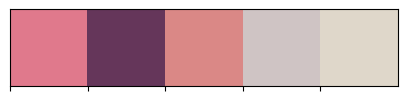

In [56]:
# Set Color Palettes for the notebook
colors_nude = ['#e0798c','#65365a','#da8886','#cfc4c4','#dfd7ca']
sns.palplot(sns.color_palette(colors_nude))


In [57]:
import numpy as np
#plt.figure(figsize = (16, 6))
#
#a = sns.countplot(shapes_train['Size'], palette=colors_nude)

#for p in a.patches:
 #   a.annotate(format(p.get_height(), ','), 
  #         (p.get_x() + p.get_width() / 2., 
   #         p.get_height()), ha = 'center', va = 'center', 
    #       xytext = (0, 4), textcoords = 'offset points')
    
#plt.title('100 Images Shapes', fontsize=16)
#sns.despine(left=True, bottom=True);

In [58]:
%matplotlib inline
import matplotlib.image as mpimg
from tabulate import tabulate
import missingno as msno 
from IPython.display import display_html
from PIL import Image
import gc
import cv2
import pydicom # for DICOM images
from skimage.transform import resize



**DICOM Images:
Malignant vs Benign Images**

Add Image Path to the csv file in order to access the data 

In [59]:
# === DICOM ===
# Create the paths
path_train = '/kaggle/input/siim-isic-melanoma-classification' + '/train/' + train_data['image_name'] + '.dcm'
path_test = '/kaggle/input/siim-isic-melanoma-classification' + '/test/' + test_data['image_name'] + '.dcm'

# Append to the original dataframes
train_data['path_dicom'] = path_train
test_data['path_dicom'] = path_test

# === JPEG ===
# Create the paths
path_train = '/kaggle/input/siim-isic-melanoma-classification' + '/jpeg/train/' + train_data['image_name'] + '.jpg'
path_test = '/kaggle/input/siim-isic-melanoma-classification' + '/jpeg/test/' + test_data['image_name'] + '.jpg'

# Append to the original dataframes
train_data['path_jpeg'] = path_train
test_data['path_jpeg'] = path_test

In [60]:
# Save the files
train_data.to_csv('train_clean.csv', index=False)
test_data.to_csv('test_clean.csv', index=False)

split the training for the train and validation

In [61]:
# Perform train-validation split
from sklearn.model_selection import train_test_split
train_df, val_df = train_test_split(train_data, test_size=0.2, random_state=42)

# Apply data augmentation to train dataset (if needed)

# Now, you can use train_df and val_df for training and validation, respectively


In [62]:
def show_images(data, n = 5, rows=1, cols=5, title='Default'):
    plt.figure(figsize=(16,4))

    for k, path in enumerate(data['path_dicom'][:n]):
        image = pydicom.read_file(path)
        image = image.pixel_array
        
        # image = resize(image, (200, 200), anti_aliasing=True)

        plt.suptitle(title, fontsize = 16)
        plt.subplot(rows, cols, k+1)
        plt.imshow(image)
        plt.axis('off')

/opt/conda/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '"1.2.840.10008.5.1.4.1.1.77.1.4"'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)


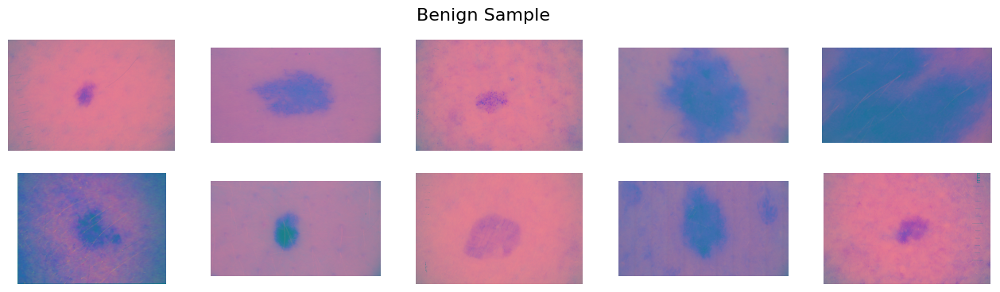

In [63]:
# Show Benign Samples
show_images(train_df[train_df['target'] == 0], n=10, rows=2, cols=5, title='Benign Sample')

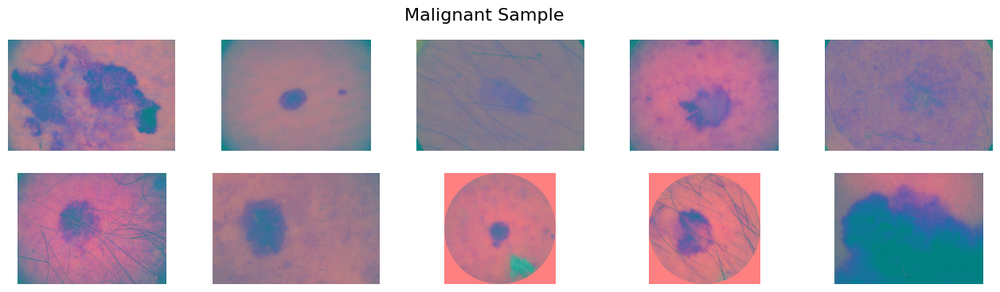

In [64]:
# Show Malignant Samples
show_images(train_df[train_df['target'] == 1], n=10, rows=2, cols=5, title='Malignant Sample')

**Data Augementation**

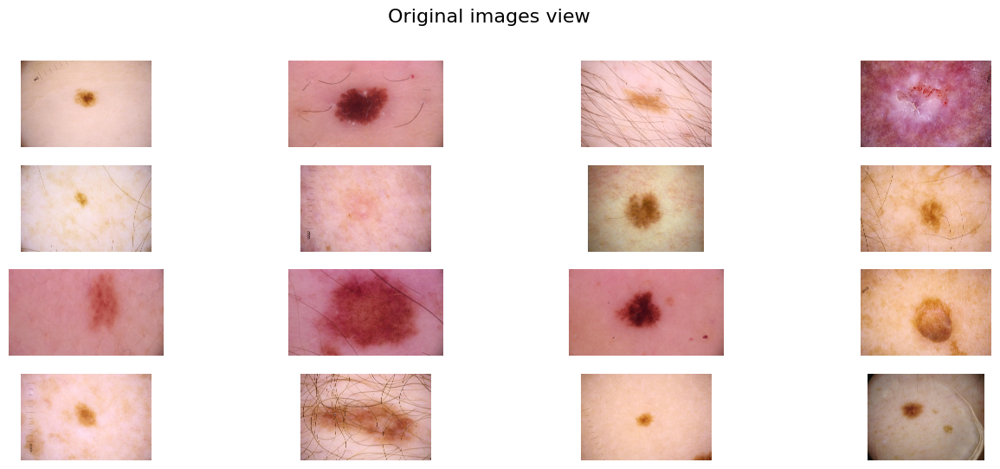

In [65]:
# Select a small sample of the .jpeg image paths
image_list = train_df.sample(16)['path_jpeg']
image_list = image_list.reset_index()['path_jpeg']

# Show the sample
plt.figure(figsize=(16,6))
plt.suptitle("Original images view", fontsize = 16)
    
for k, path in enumerate(image_list):
    image = mpimg.imread(path)
        
    plt.subplot(4, 4, k+1)
    plt.imshow(image)
    plt.axis('off')

/opt/conda/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '"1.2.840.10008.5.1.4.1.1.77.1.4"'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)


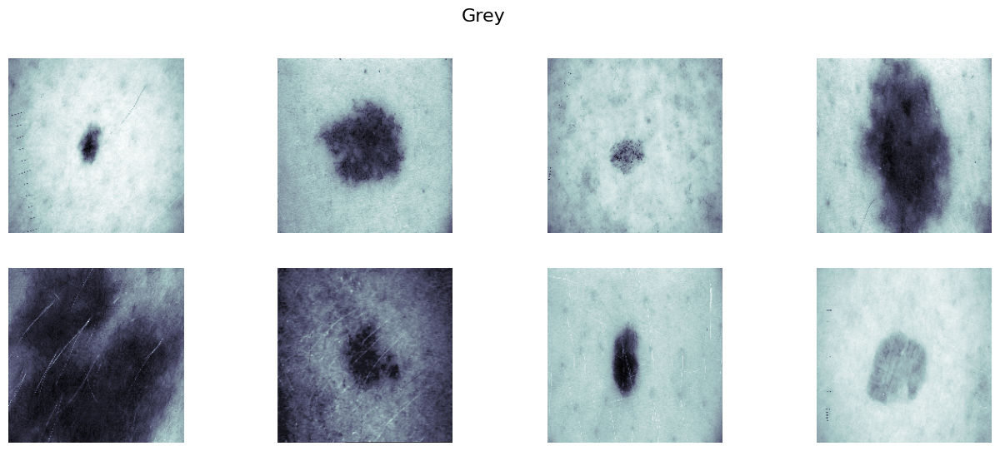

In [66]:
import pydicom
import cv2
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16, 6))
plt.suptitle("Grey", fontsize=16)

for i in range(0, min(2*4, len(train_df['path_dicom']))):
    data = pydicom.read_file(train_df['path_dicom'].iloc[i])
    image = data.pixel_array
    
    # Transform to B&W
    # The function converts an input image from one color space to another.
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    image = cv2.resize(image, (200, 200))
    
    x = i // 4
    y = i % 4
    axes[x, y].imshow(image, cmap=plt.cm.bone) 
    axes[x, y].axis('off')


**Ben Graham: greyscale + Gaussian Blur**

With Gaussian Blur

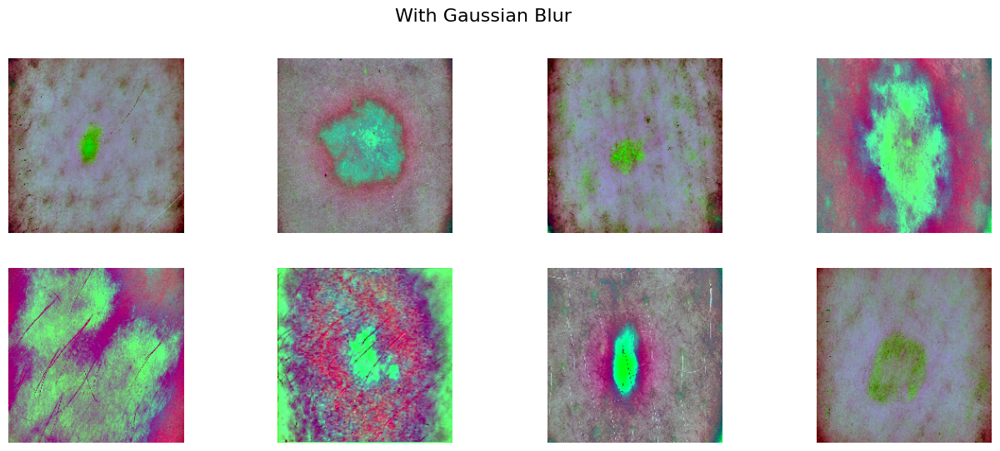

In [67]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16,6))
plt.suptitle("With Gaussian Blur", fontsize=16)

for i, row in enumerate(train_df.iterrows()):
    if i >= 2*4:
        break
    _, data = row
    image = pydicom.read_file(data['path_dicom']).pixel_array
    
    # Transform to B&W
    # The function converts an input image from one color space to another.
    image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    image = cv2.resize(image, (200,200))
    image = cv2.addWeighted(image, 4, cv2.GaussianBlur(image, (0,0) ,256/10), -4, 128)
    
    x = i // 4
    y = i % 4
    axes[x, y].imshow(image, cmap=plt.cm.bone) 
    axes[x, y].axis('off')


In [68]:
print("Length of train_df:", len(train_df))
print("Length of train_df:", len(val_df))

Length of train_df: 26500
Length of train_df: 6626


Without Gaussian Blur

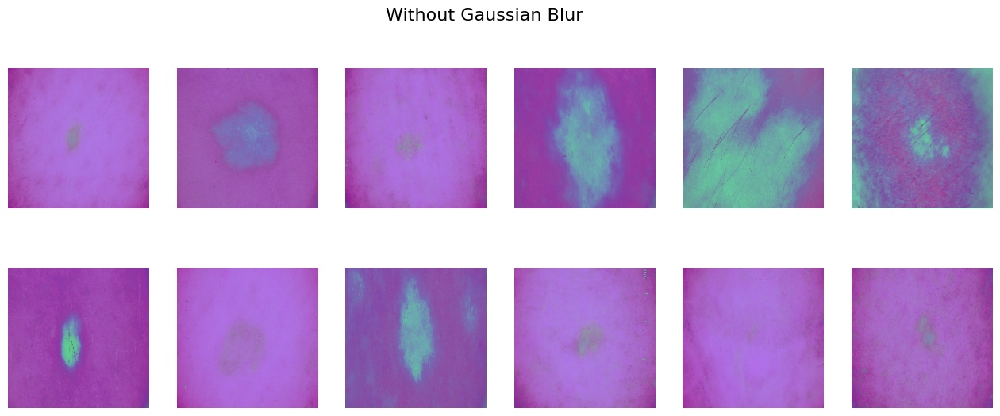

In [69]:
fig, axes = plt.subplots(nrows=2, ncols=6, figsize=(16,6))
plt.suptitle("Without Gaussian Blur", fontsize=16)

for i in range(0, min(2*6, len(train_df))):
    data = pydicom.read_file(train_df['path_dicom'].iloc[i])  # Use .iloc[i] instead of [i]
    image = data.pixel_array
    
    # Transform to B&W
    # The function converts an input image from one color space to another.
    image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    image = cv2.resize(image, (200,200))
    
    x = i // 6
    y = i % 6
    axes[x, y].imshow(image, cmap=plt.cm.bone) 
    axes[x, y].axis('off')


Hue, Saturation, Brightness

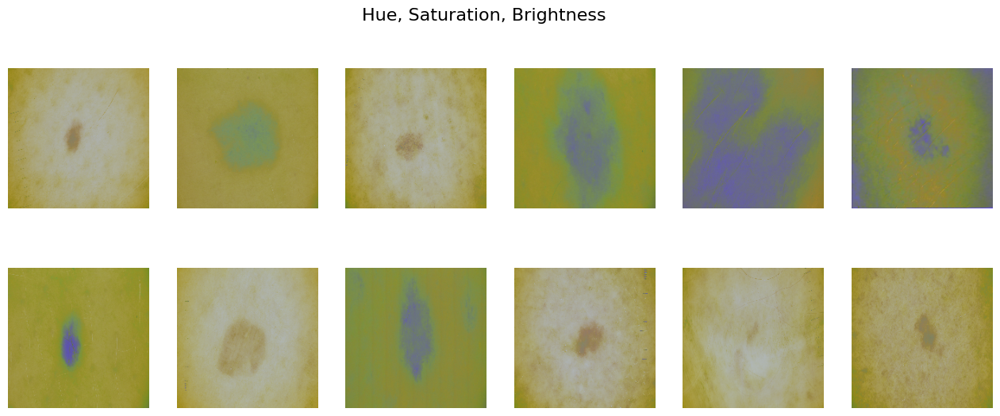

In [70]:
fig, axes = plt.subplots(nrows=2, ncols=6, figsize=(16,6))
plt.suptitle("Hue, Saturation, Brightness", fontsize=16)

for i in range(0, min(2*6, len(train_df))):
    data = pydicom.read_file(train_df['path_dicom'].iloc[i])  # Use .iloc[i] instead of [i]
    image = data.pixel_array
    
    # Transform to B&W
    # The function converts an input image from one color space to another.
    image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    image = cv2.resize(image, (200,200))
    
    x = i // 6
    y = i % 6
    axes[x, y].imshow(image, cmap=plt.cm.bone) 
    axes[x, y].axis('off')


LUV Color Space

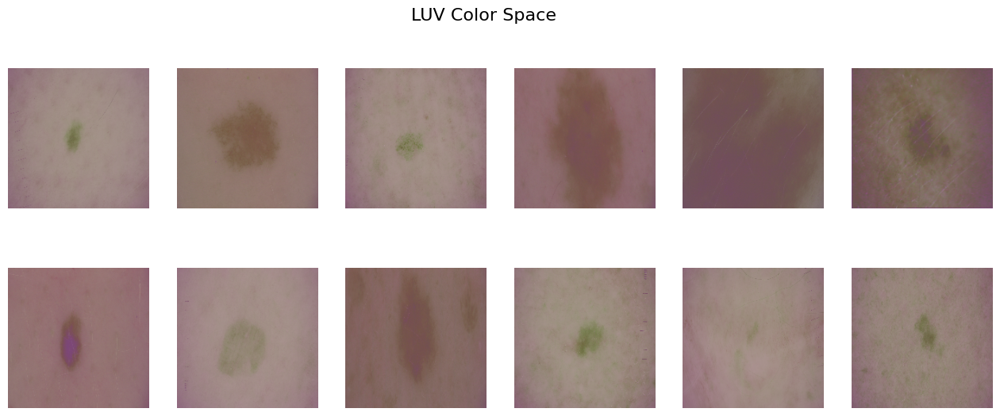

In [71]:
fig, axes = plt.subplots(nrows=2, ncols=6, figsize=(16,6))
plt.suptitle("LUV Color Space", fontsize=16)

for i in range(0, min(2*6, len(train_df))):
    data = pydicom.read_file(train_df['path_dicom'].iloc[i])  # Use .iloc[i] instead of [i]
    image = data.pixel_array
    
    # Transform to B&W
    # The function converts an input image from one color space to another.
    image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
    image = cv2.resize(image, (200,200))
    
    x = i // 6
    y = i % 6
    axes[x, y].imshow(image, cmap=plt.cm.bone) 
    axes[x, y].axis('off')


Torchvision.transforms

In [72]:
# Necessary Imports
import torch
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms
import torchvision

In [73]:
# Create PyTorch Dataset Object
class DatasetExample(Dataset):
    def __init__(self, image_list, transforms=None):
        self.image_list = image_list
        self.transforms = transforms
    
    # To get item's length
    def __len__(self):
        return (len(self.image_list))
    
    # For indexing
    def __getitem__(self, i):
        # Read in image
        image = plt.imread(self.image_list[i])
        image = Image.fromarray(image).convert('RGB')        
        image = np.asarray(image).astype(np.uint8)
        if self.transforms is not None:
            image = self.transforms(image)
            
        return torch.tensor(image, dtype=torch.float)
    

    # Predefined Show Images Function
def show_transform(image, title="Default"):
    plt.figure(figsize=(16,6))
    plt.suptitle(title, fontsize = 16)
    
    # Unnormalize
    image = image / 2 + 0.5  
    npimg = image.numpy()
    npimg = np.clip(npimg, 0., 1.)
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()  


1. Crop ✂

/tmp/ipykernel_18/3139537778.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(image, dtype=torch.float)


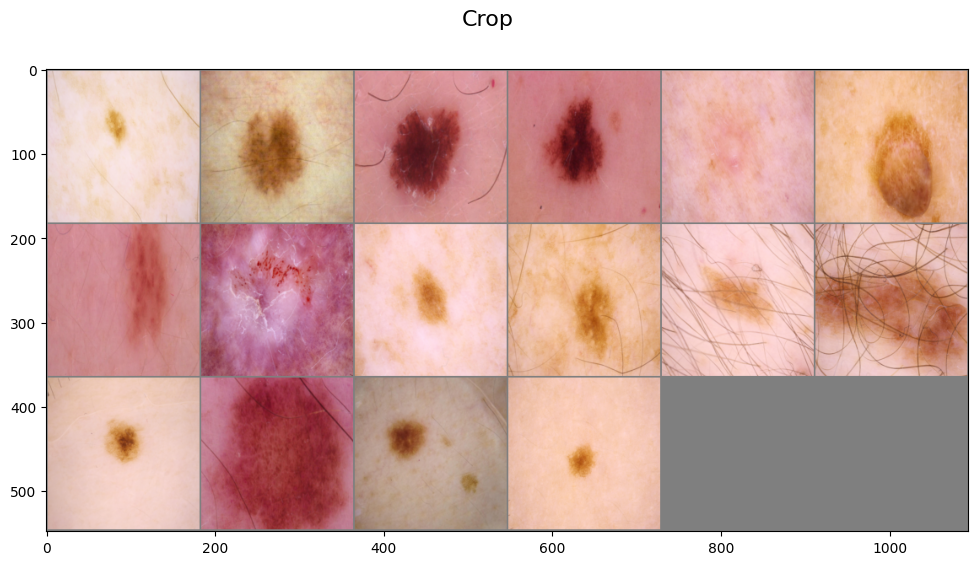

In [74]:
# Transform
transform = transforms.Compose([
     transforms.ToPILImage(),
     transforms.Resize((244, 244)),
     transforms.CenterCrop((180, 180)),
     transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
     ])

# Create the dataset
pytorch_dataset = DatasetExample(image_list=image_list, transforms=transform)
pytorch_dataloader = DataLoader(dataset=pytorch_dataset, batch_size=32, shuffle=True)

# Select the data
images = next(iter(pytorch_dataloader))
 
# show images
show_transform(torchvision.utils.make_grid(images, nrow=6), title="Crop")

2. ColorJitter 🌫

/tmp/ipykernel_18/3139537778.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(image, dtype=torch.float)


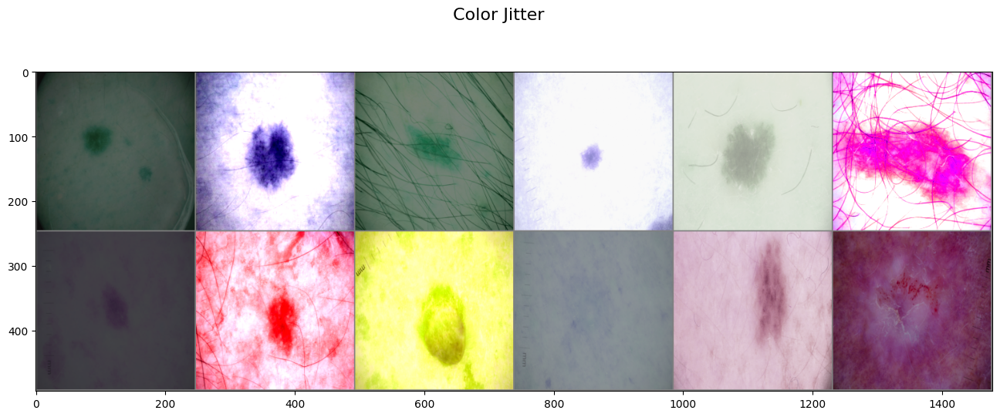

In [75]:
# Transform
transform = transforms.Compose([
     transforms.ToPILImage(),
     transforms.Resize((244, 244)),
     transforms.ColorJitter(brightness=0.7, contrast=0.7, saturation=0.7, hue=0.5),
     transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
     ])

# Create the dataset
pytorch_dataset = DatasetExample(image_list=image_list, transforms=transform)
pytorch_dataloader = DataLoader(dataset=pytorch_dataset, batch_size=12, shuffle=True)

# Select the data
images = next(iter(pytorch_dataloader))
 
# show images
show_transform(torchvision.utils.make_grid(images, nrow=6), title="Color Jitter")

3. RandomGreyscale

/tmp/ipykernel_18/3139537778.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(image, dtype=torch.float)


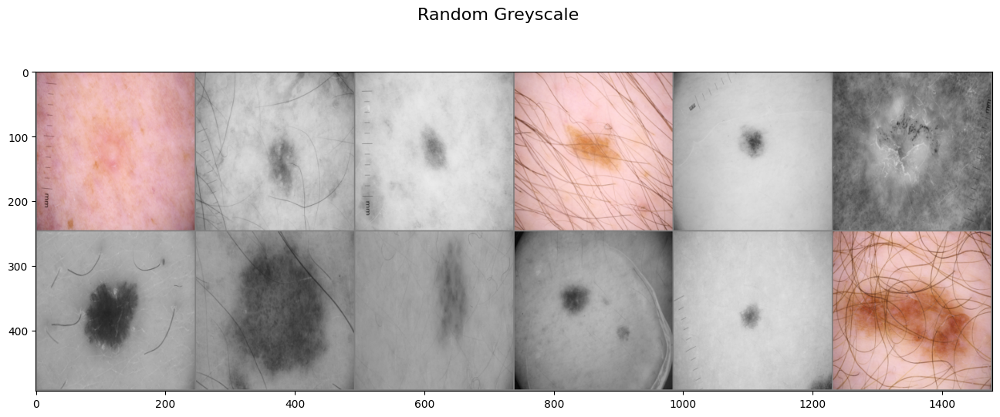

In [76]:
# Transform
transform = transforms.Compose([
     transforms.ToPILImage(),
     transforms.Resize((244, 244)),
     transforms.RandomGrayscale(p=0.7),
     transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
     ])

# Create the dataset
pytorch_dataset = DatasetExample(image_list=image_list, transforms=transform)
pytorch_dataloader = DataLoader(dataset=pytorch_dataset, batch_size=12, shuffle=True)

# Select the data
images = next(iter(pytorch_dataloader))
 
# show images
show_transform(torchvision.utils.make_grid(images, nrow=6), title="Random Greyscale")

RandomVerticalFlip

/tmp/ipykernel_18/3139537778.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(image, dtype=torch.float)


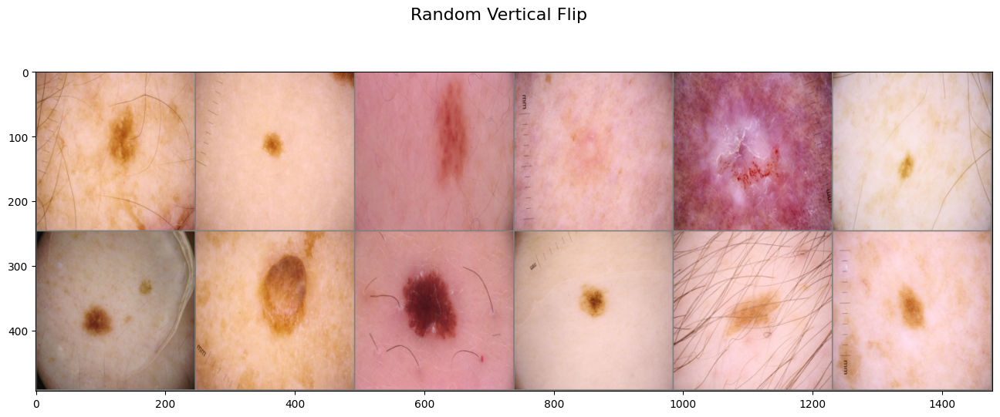

In [77]:
# Transform
transform = transforms.Compose([
     transforms.ToPILImage(),
     transforms.Resize((244, 244)),
     transforms.RandomVerticalFlip(p=0.7),
     transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
     ])

# Create the dataset
pytorch_dataset = DatasetExample(image_list=image_list, transforms=transform)
pytorch_dataloader = DataLoader(dataset=pytorch_dataset, batch_size=12, shuffle=True)

# Select the data
images = next(iter(pytorch_dataloader))
 
# show images
show_transform(torchvision.utils.make_grid(images, nrow=6), title="Random Vertical Flip")

**Hair Removal ✂**

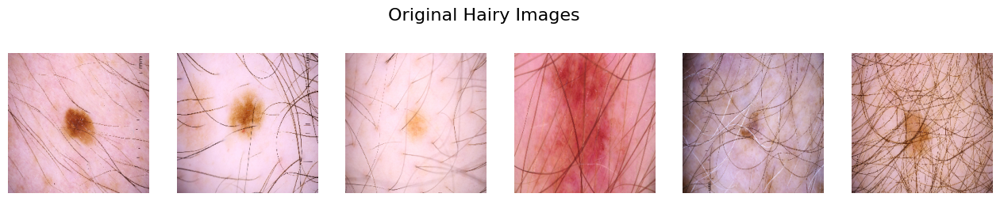

In [78]:
def hair_remove(image):
    # convert image to grayScale
    grayScale = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # kernel for morphologyEx
    kernel = cv2.getStructuringElement(1,(17,17))

    # apply MORPH_BLACKHAT to grayScale image
    blackhat = cv2.morphologyEx(grayScale, cv2.MORPH_BLACKHAT, kernel)

    # apply thresholding to blackhat
    _,threshold = cv2.threshold(blackhat,10,255,cv2.THRESH_BINARY)

    # inpaint with original image and threshold image
    final_image = cv2.inpaint(image,threshold,1,cv2.INPAINT_TELEA)

    return final_image

# Select a small sample of the .jpeg image paths
# We select some hairy photos on purpose
hairy_photos = train_data[train_data["sex"] == 1].reset_index().iloc[[12, 14, 17, 22, 33, 34]]
image_list = hairy_photos['path_jpeg']
image_list = image_list.reset_index()['path_jpeg']


# Show the Augmented Images
plt.figure(figsize=(16,3))
plt.suptitle("Original Hairy Images", fontsize = 16)
    
for k, path in enumerate(image_list):
    image = mpimg.imread(path)
    image = cv2.resize(image,(244, 244))
        
    plt.subplot(1, 6, k+1)
    plt.imshow(image)
    plt.axis('off')

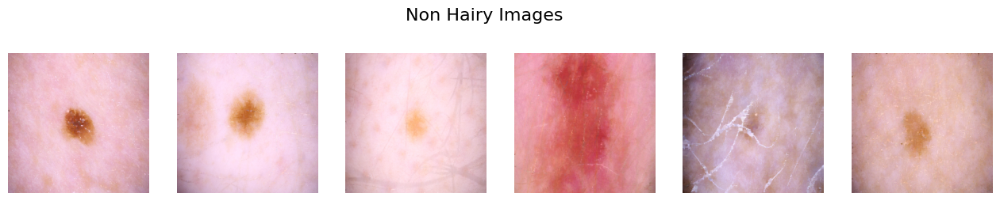

In [79]:
# Show the sample
plt.figure(figsize=(16,3))
plt.suptitle("Non Hairy Images", fontsize = 16)
    
for k, path in enumerate(image_list):
    image = mpimg.imread(path)
    image = cv2.resize(image,(244, 244))
    image = hair_remove(image)
        
    plt.subplot(1, 6, k+1)
    plt.imshow(image)
    plt.axis('off')

In [80]:
cropped_width = images.shape[2]
cropped_height = images.shape[3]

print("Width of cropped images:", cropped_width)
print("Height of cropped images:", cropped_height)


Width of cropped images: 244
Height of cropped images: 244


*******************************************************************************************************
*******************************************************************************************************

In [81]:
import pathlib
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D,Input
from tensorflow.keras.layers import Dense

2024-04-18 04:28:05.015702: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-18 04:28:05.015848: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-18 04:28:05.194886: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [82]:
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Rescaling
from tensorflow.keras import Sequential

input_shape = (244, 244, 3)  # Define the input shape for 180x180 images

model = Sequential()

# Adding Rescaling layer for input preprocessing
model.add(Rescaling(1./255, input_shape=input_shape))

# CNN Layers
model.add(Conv2D(32,(3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(32,(3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(16,(3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(16,(3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(16,(3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(16,(3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Flatten layer
model.add(Flatten())

# Dense Layers
model.add(Dense(50, activation='relu'))
model.add(Dense(100, activation='relu'))
model.add(Dense(200, activation='relu'))

# Output layer
model.add(Dense(2, activation='softmax'))

# Compile the model, add loss function and optimizer
# model.compile(...)

# Optionally, print the model summary
# model.summary()


/opt/conda/lib/python3.10/site-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [83]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 244, 244, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 242, 242, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 121, 121, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 119, 119, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 59, 59, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 57, 57, 16)     │         4,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 26, 26, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 13, 13, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 11, 11, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 5, 5, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 3, 3, 16)       │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 1, 1, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 50)             │           850 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 100)            │         5,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 200)            │        20,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 2)              │           402 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 48,280 (188.59 KB)

 Trainable params: 48,280 (188.59 KB)

 Non-trainable params: 0 (0.00 B)

In [84]:
model.compile(loss="sparse_categorical_crossentropy", 
              optimizer="adam",
              metrics=["accuracy"])

In [ ]:
# Calculate the number of steps per epoch
samples = 33126
batch_size = 32
steps_per_epoch = samples // batch_size

print("Steps per epoch:", steps_per_epoch)

# Assuming train_df and val_df are your training and validation data generators respectively
history = model.fit(
    train_df,
    steps_per_epoch=steps_per_epoch,
    epochs=10,
    validation_data=val_df
)


*******************************************************************************************************

*******************************************************************************************************

*********************************************************************************************************************************************************

*********************************************************************************************************************************************************

*******************************************************************************************************

*******************************************************************************************************